In [4]:
!pip install ultralytics opencv-python opencv-python-headless cvzone
from ultralytics import YOLO
import cv2
import cvzone
import math
import time

In [5]:
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode
import cv2
import numpy as np
import io
from PIL import Image
import time

# JavaScript code to capture webcam photo
def take_photo():
    js = Javascript('''
    async function takePhoto() {
        const video = document.createElement('video');
        const stream = await navigator.mediaDevices.getUserMedia({video: true});
        document.body.appendChild(video);
        video.srcObject = stream;
        await video.play();

        const canvas = document.createElement('canvas');
        canvas.width = video.videoWidth;
        canvas.height = video.videoHeight;
        canvas.getContext('2d').drawImage(video, 0, 0);
        stream.getVideoTracks()[0].stop();
        video.remove();
        return canvas.toDataURL('image/jpeg', 0.8);
    }
    takePhoto();
    ''')
    display(js)
    data = eval_js('takePhoto()')
    return data

# Convert JavaScript object to an OpenCV image
def js_to_image(js_reply):
    image_bytes = b64decode(js_reply.split(',')[1])
    image = Image.open(io.BytesIO(image_bytes))
    return np.array(image)

In [6]:
from ultralytics import YOLO

# Load the YOLOv8 model
model = YOLO("yolov8m.pt")

100%|██████████| 49.7M/49.7M [00:00<00:00, 71.5MB/s]


In [7]:
import cvzone
import math

# Define the class names for YOLO model
classNames = ["person", "bicycle", "pizza", "motorbike", "aeroplane", "bus", "train", "car", "truck", "boat",
              "traffic light", "fire hydrant", "stop sign", "parking meter", "bench", "bird", "cat",
              "dog", "horse", "sheep", "cow", "elephant", "bear", "zebra", "giraffe", "backpack", "umbrella",
              "handbag", "tie", "suitcase", "frisbee", "skis", "snowboard", "sports ball", "kite", "baseball bat",
              "baseball glove", "skateboard", "surfboard", "tennis racket", "bottle", "wine glass", "cup",
              "fork", "knife", "spoon", "bowl", "banana", "apple", "sandwich", "orange", "broccoli",
              "carrot", "hot dog", "donut", "cake", "chair", "sofa", "pottedplant", "bed",
              "diningtable", "toilet", "tvmonitor", "laptop", "mouse", "remote", "keyboard", "cell phone",
              "microwave", "oven", "toaster", "sink", "refrigerator", "book", "clock", "vase", "scissors",
              "teddy bear", "hair drier", "toothbrush"]

# Function to process each frame and perform object detection
def process_frame(img):
    results = model(img, stream=True)  # Run YOLOv8 model

    for r in results:
        boxes = r.boxes  # Extract bounding boxes
        for box in boxes:
            # Get coordinates for the bounding box
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            w, h = x2 - x1, y2 - y1
            cvzone.cornerRect(img, (x1, y1, w, h))  # Draw rectangle

            # Get confidence score and class ID
            conf = math.ceil((box.conf[0] * 100)) / 100
            cls = int(box.cls[0])

            # Put class name and confidence on image
            cvzone.putTextRect(img, f'{classNames[cls]} {conf}', (max(0, x1), max(35, y1)), scale=1, thickness=1)

    return img

# Function to display the image in Colab
from PIL import Image as PILImage

def display_image(img):
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for display
    display(PILImage.fromarray(img_rgb))


<IPython.core.display.Javascript object>


0: 480x640 3 persons, 1176.0ms
Speed: 3.9ms preprocess, 1176.0ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


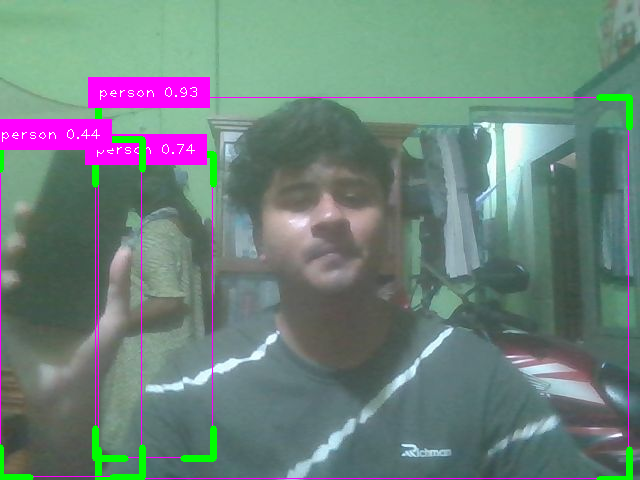

<IPython.core.display.Javascript object>


0: 480x640 1 person, 1 cell phone, 1150.6ms
Speed: 5.8ms preprocess, 1150.6ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


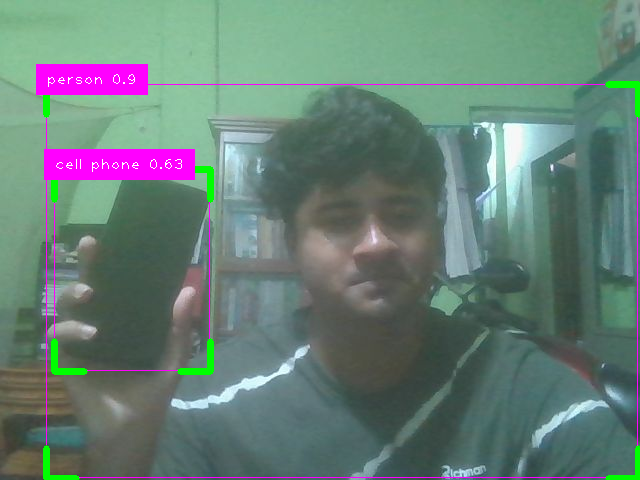

<IPython.core.display.Javascript object>


0: 480x640 1 person, 1 chair, 1 cell phone, 5 books, 1152.9ms
Speed: 5.4ms preprocess, 1152.9ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


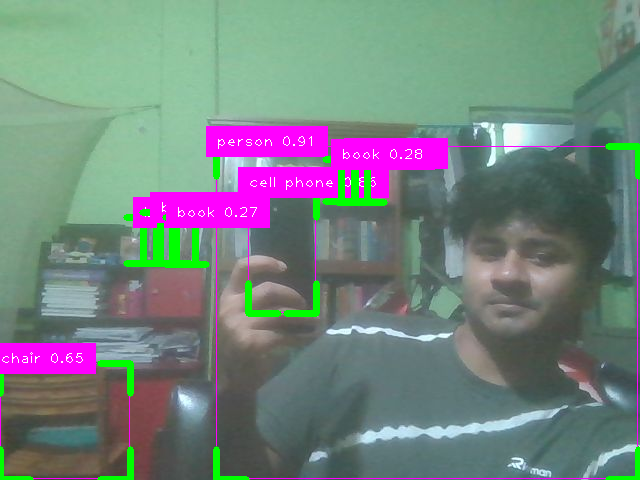

<IPython.core.display.Javascript object>


0: 480x640 1 person, 1 chair, 1 cell phone, 2 books, 1900.2ms
Speed: 6.8ms preprocess, 1900.2ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)


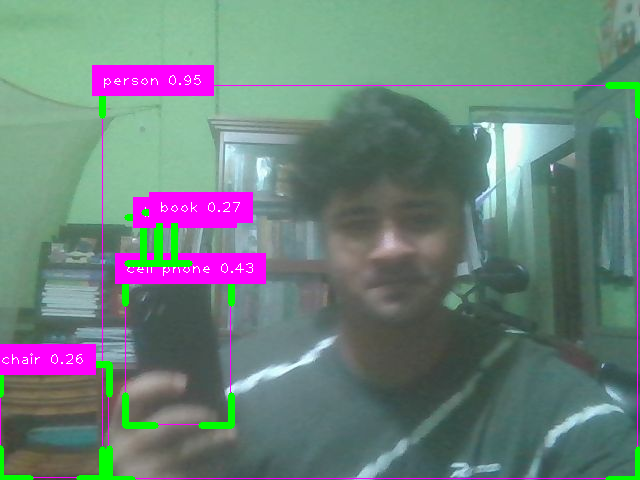

<IPython.core.display.Javascript object>


0: 480x640 1 person, 1158.5ms
Speed: 5.4ms preprocess, 1158.5ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


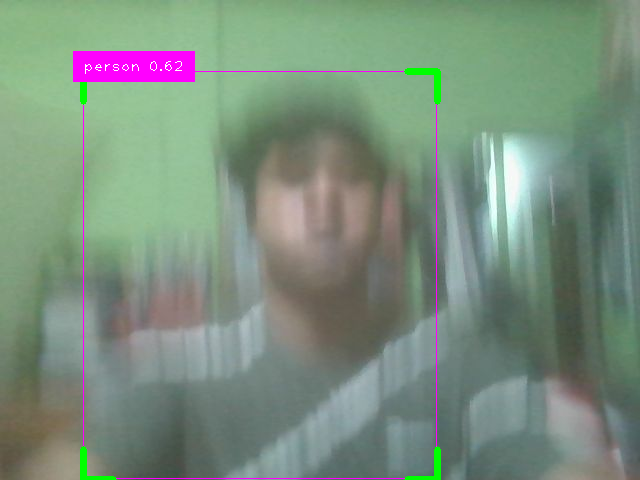

<IPython.core.display.Javascript object>


0: 480x640 1 person, 1172.3ms
Speed: 5.9ms preprocess, 1172.3ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)


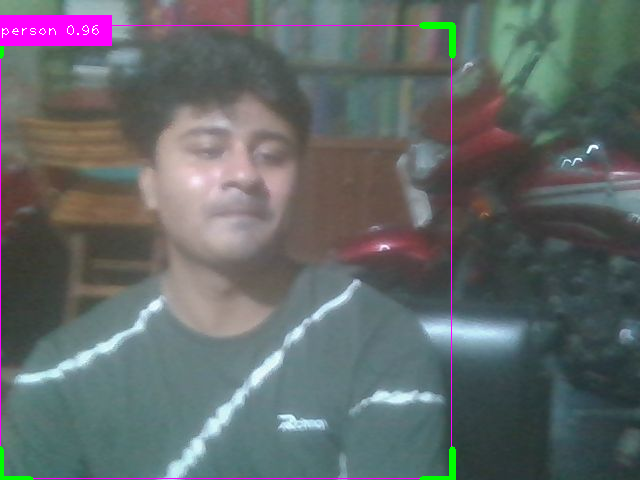

<IPython.core.display.Javascript object>


0: 480x640 1 person, 1 remote, 2 cell phones, 1 book, 1207.2ms
Speed: 5.3ms preprocess, 1207.2ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)


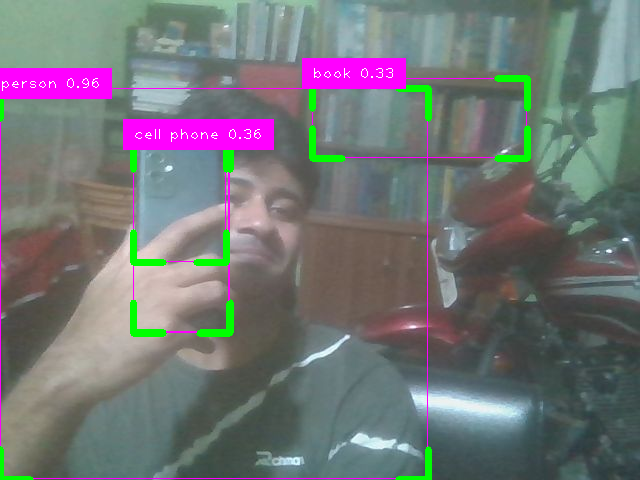

<IPython.core.display.Javascript object>


0: 480x640 1 person, 2 cell phones, 1158.6ms
Speed: 3.4ms preprocess, 1158.6ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


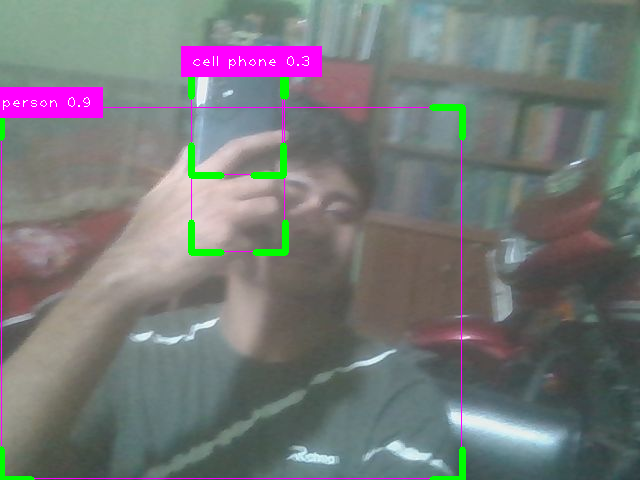

<IPython.core.display.Javascript object>


0: 480x640 1 person, 1 chair, 1 book, 1370.7ms
Speed: 5.8ms preprocess, 1370.7ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)


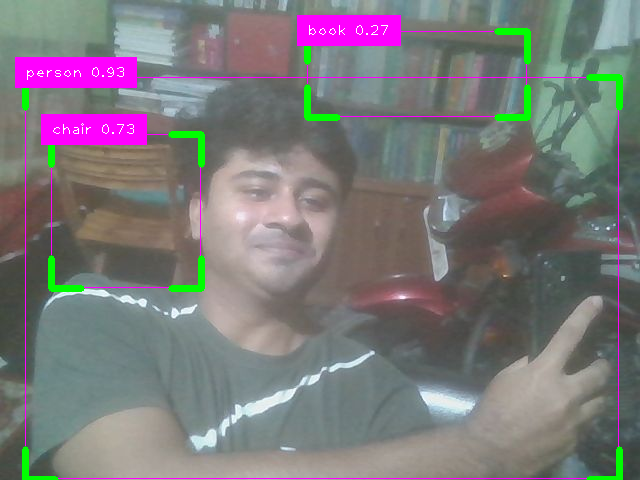

<IPython.core.display.Javascript object>


0: 480x640 2 persons, 1688.2ms
Speed: 5.0ms preprocess, 1688.2ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


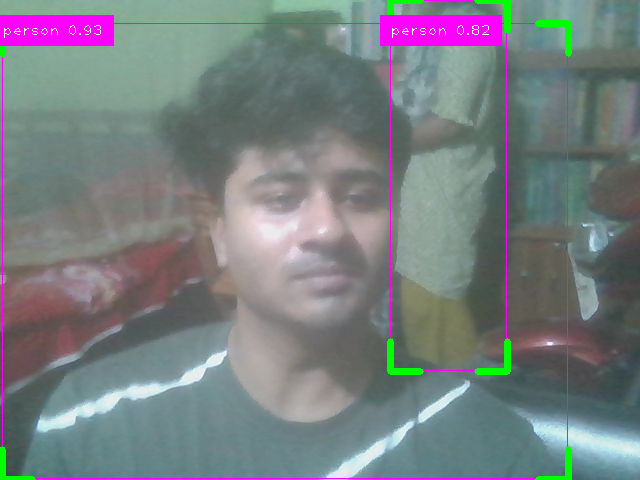

<IPython.core.display.Javascript object>


0: 480x640 1 person, 1 mouse, 1 book, 1164.2ms
Speed: 5.6ms preprocess, 1164.2ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


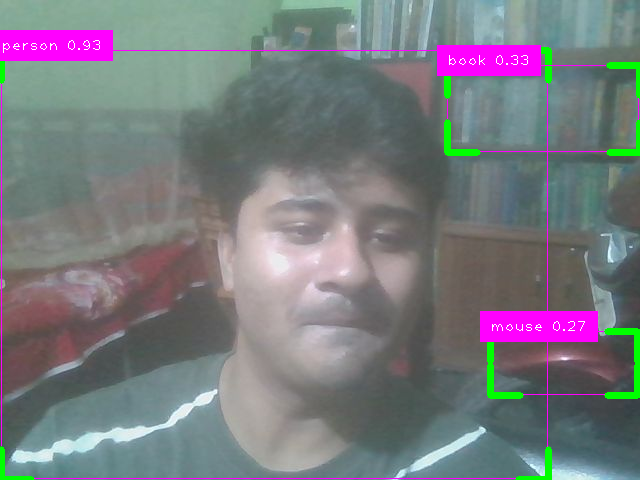

<IPython.core.display.Javascript object>


0: 480x640 1 person, 1166.6ms
Speed: 5.6ms preprocess, 1166.6ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


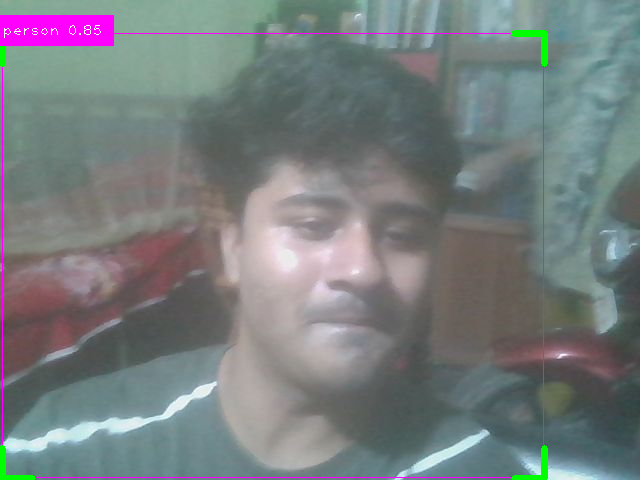

<IPython.core.display.Javascript object>


0: 480x640 1 person, 1173.0ms
Speed: 8.0ms preprocess, 1173.0ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


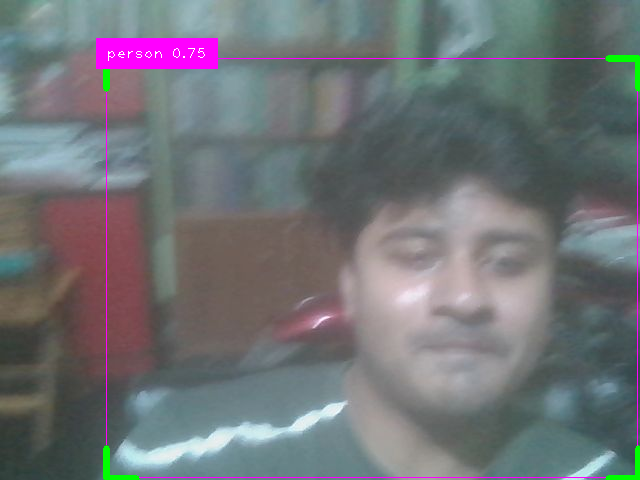

<IPython.core.display.Javascript object>


0: 480x640 2 persons, 1 chair, 1 book, 1189.7ms
Speed: 3.2ms preprocess, 1189.7ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


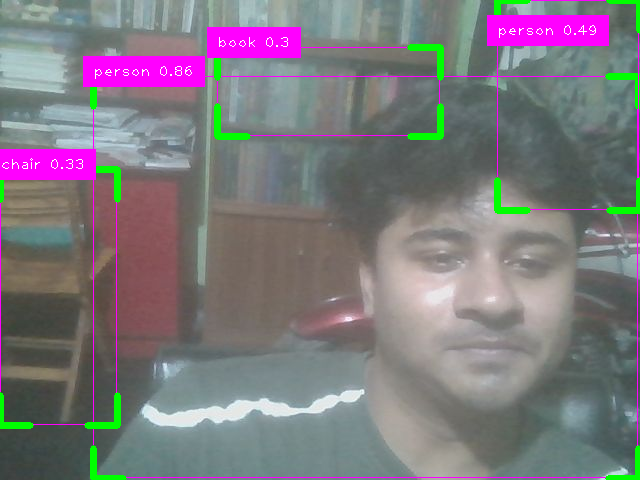

<IPython.core.display.Javascript object>


0: 480x640 2 persons, 1 book, 1833.1ms
Speed: 3.2ms preprocess, 1833.1ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 640)


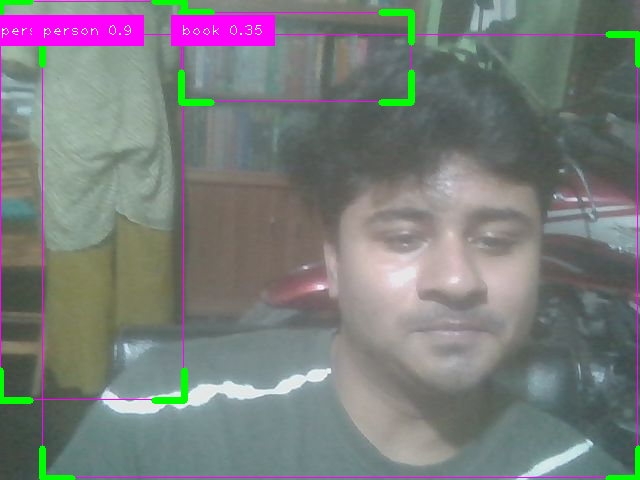

<IPython.core.display.Javascript object>


0: 480x640 2 persons, 1 book, 1877.7ms
Speed: 7.0ms preprocess, 1877.7ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)


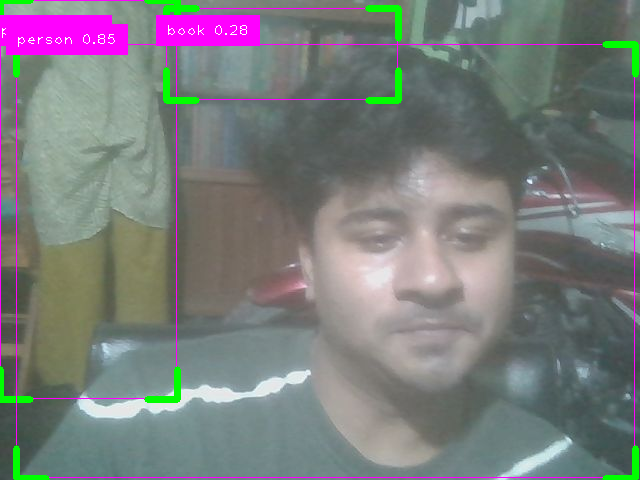

<IPython.core.display.Javascript object>


0: 480x640 2 persons, 1171.4ms
Speed: 5.9ms preprocess, 1171.4ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


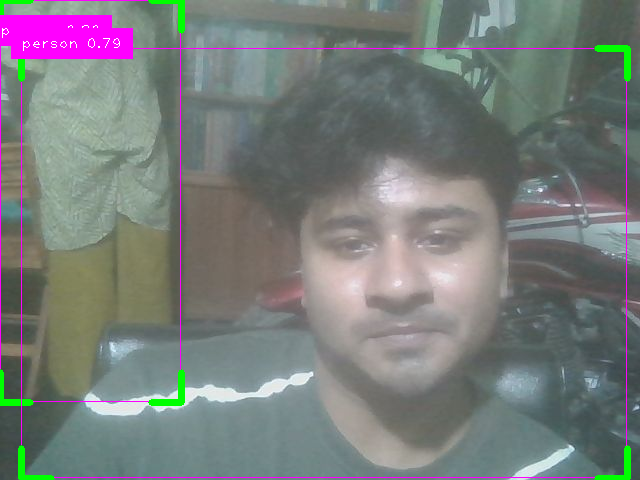

<IPython.core.display.Javascript object>


0: 480x640 1 dining table, 1 book, 1176.8ms
Speed: 5.8ms preprocess, 1176.8ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)


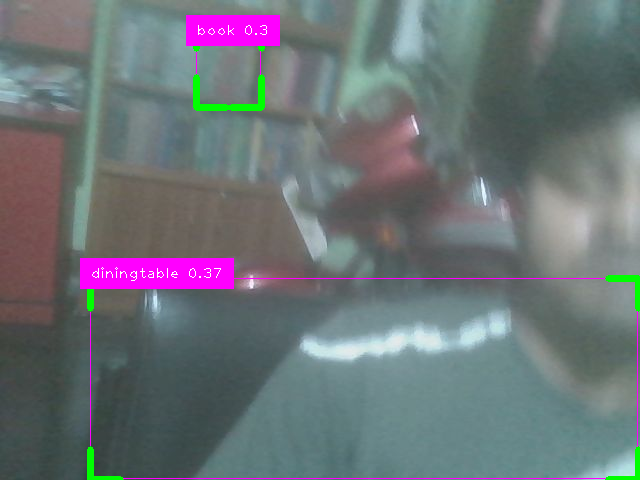

<IPython.core.display.Javascript object>


0: 480x640 2 persons, 1 book, 1186.3ms
Speed: 7.0ms preprocess, 1186.3ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


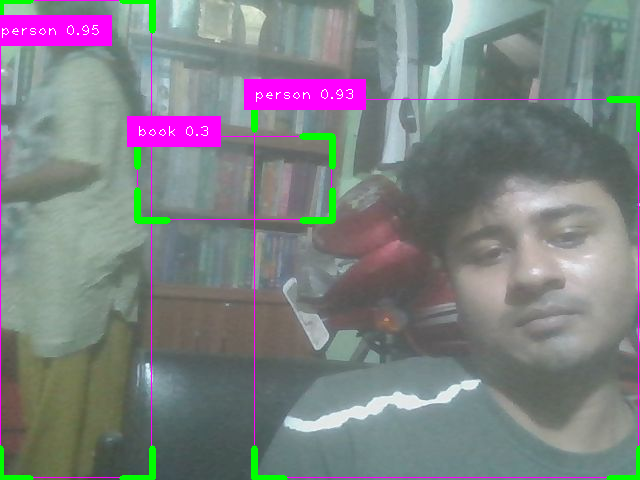

<IPython.core.display.Javascript object>


0: 480x640 1 person, 2 books, 1202.1ms
Speed: 5.8ms preprocess, 1202.1ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


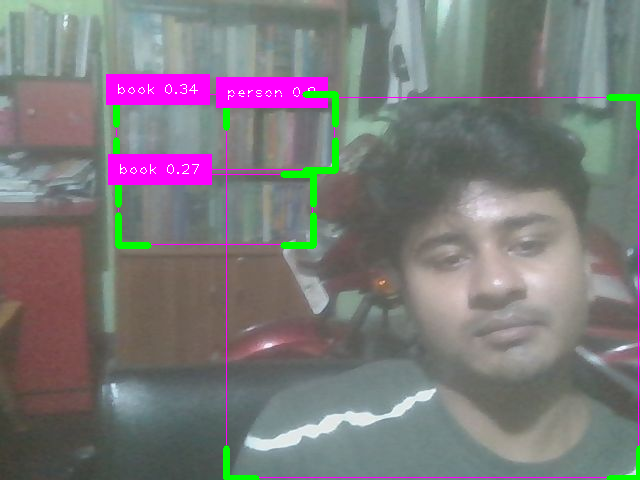

<IPython.core.display.Javascript object>


0: 480x640 1 person, 1 book, 1199.5ms
Speed: 6.4ms preprocess, 1199.5ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


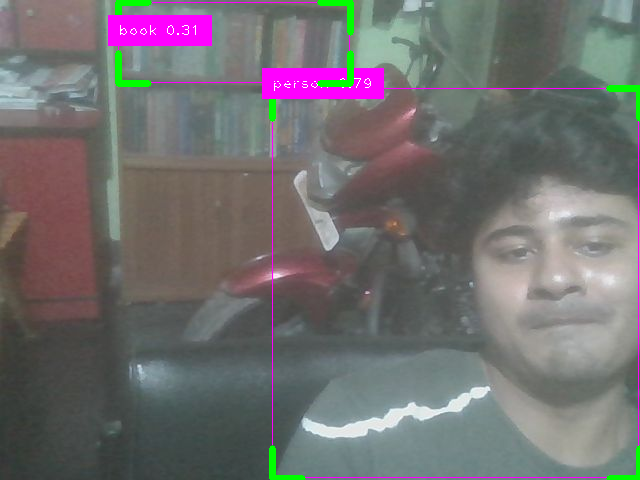

<IPython.core.display.Javascript object>


0: 480x640 2 persons, 1 motorcycle, 2 books, 1510.1ms
Speed: 6.5ms preprocess, 1510.1ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


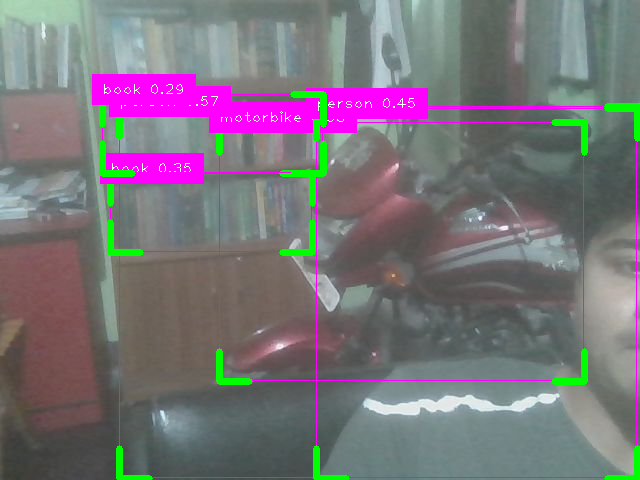

<IPython.core.display.Javascript object>


0: 480x640 2 persons, 1 motorcycle, 1 book, 1180.7ms
Speed: 3.4ms preprocess, 1180.7ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


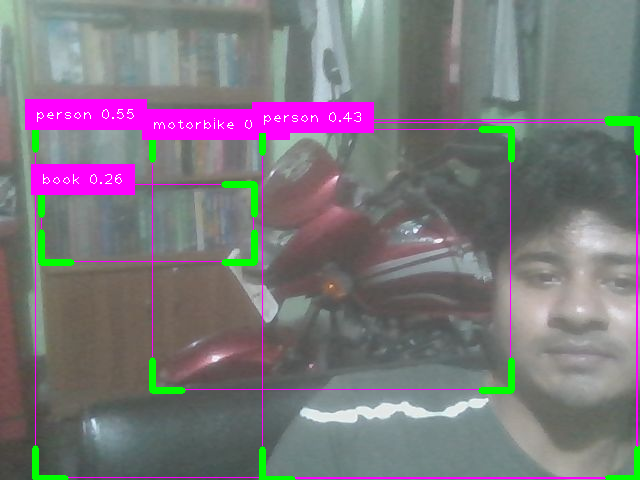

<IPython.core.display.Javascript object>


0: 480x640 2 persons, 1 book, 1217.5ms
Speed: 5.9ms preprocess, 1217.5ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


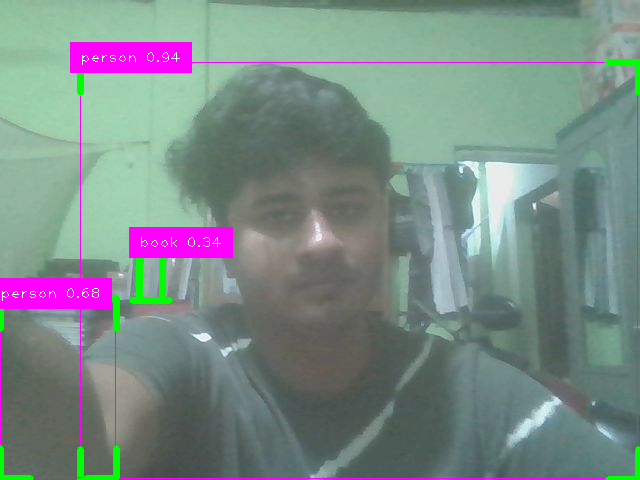

<IPython.core.display.Javascript object>


0: 480x640 1 person, 1 cell phone, 1 book, 1204.6ms
Speed: 7.3ms preprocess, 1204.6ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


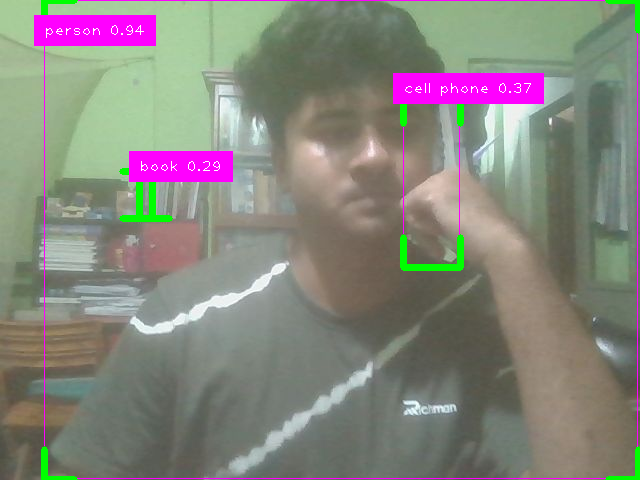

KeyboardInterrupt: 

In [12]:
while True:
    # Capture photo from the webcam
    js_reply = take_photo()

    # Convert the JavaScript captured image to OpenCV format
    img = js_to_image(js_reply)
    img_bgr = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)  # Convert to BGR for OpenCV

    # Process the image with YOLOv8
    processed_img = process_frame(img_bgr)

    # Display the processed image
    display_image(processed_img)

    # Delay between captures
    time.sleep(10)  # Capture a new frame every second